In [2]:
#* for data manipulation 
import pandas as pd 
import numpy as np 


from disk_analysis_tools import tiling_disk_plots as tdp
from disk_analysis_tools import tiling_disk_utils as tdu

#* for plotting: 
import matplotlib.pyplot as plt 
import seaborn as sns
%matplotlib inline
sns.set_theme(style="ticks")
sns.set_context("talk")
#

In [3]:
exp_db = tdu.query_exp_db()

In [4]:
exp_db.iloc[24].exp_description

'triplets v7: blue: v=3.8mm/s; brown:v=4mm/s; v=4.2mm/s; blue tip'

In [5]:
meta_data = tdu.fetch_meas_metadata(exp_id=25)

In [6]:
meta_data

,measurement_id,exp_id,date,file_name,material,process_step,vac_mapping,coordinates,meas_cap_status,comments
0,127,25,14.04.2022,20220414_trip_v7_bfg.txt,steel,before_glue,"[1,1000]",coordinate-blue-brown-yellow.txt,1,before gluing; no vacuum -> measurement looks ...
1,128,25,14.04.2022,20220414_trip_v7_curing.txt,steel,curing,"[n,1000]",coordinate-blue-brown-yellow.txt,1,curing v7 reps 24


# ref measurement

import

In [7]:
from pathlib import Path
measurement_folder  = Path.cwd().parent / 'measurements' / 'triplets'

In [8]:
before_hardening_tripplets_df = tdu.read_single_measurement(measurement_folder, '20220414_trip_v7_bfg.txt')

Reading data...
Reading done


examine raw data

clean everything more then $\pm$ 100µm deviation from mean of single hexagon 

In [ ]:
ref_mean = before_hardening_tripplets_df.z.median()
print(ref_mean)
before_hardening_tripplets_df = tdu.remove_outliers(
                                before_hardening_tripplets_df,
                                cut_threshold=0.1
                                ) # kill everything over 100µm

-156.913


In [ ]:
before_hardening_tripplets_df.z.count()

6310

In [ ]:
before_hardening_tripplets_df.z_clean.isna().count()

AttributeError: 'DataFrame' object has no attribute 'z_clean'

In [ ]:
before_hardening_tripplets_df.head(5)

,run_nr,hex_nr,point,x,y,z,unix_time,datetime,z_clean
0,1,19,1,-93.20,61.00,-156.858,1649927228,2022-04-14 11:07:08+02:00,-156.858
1,1,19,1,-93.39,61.19,-156.944,1649927228,2022-04-14 11:07:08+02:00,-156.944
2,1,19,1,-93.64,61.25,-156.919,1649927228,2022-04-14 11:07:08+02:00,-156.919
3,1,19,1,-93.89,61.19,-156.944,1649927229,2022-04-14 11:07:09+02:00,-156.944
4,1,19,1,-94.07,61.00,-156.913,1649927229,2022-04-14 11:07:09+02:00,-156.913


examine remaining data

(<Figure size 504x432 with 1 Axes>,
 <AxesSubplot:xlabel='z [µm]', ylabel='Count'>)

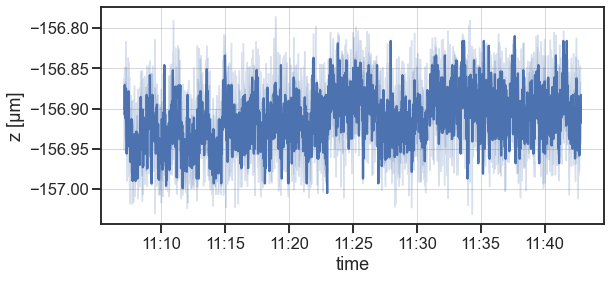

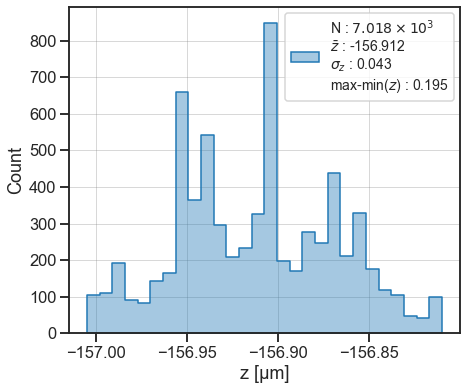

In [ ]:
tdp.plot_data_vs_time(before_hardening_tripplets_df, mode='z_clean')
bins = np.arange(before_hardening_tripplets_df.z_clean.min(), before_hardening_tripplets_df.z_clean.max(), 12e-3)
tdp.ts_hist(before_hardening_tripplets_df, mode='z_clean')


In [ ]:
bf_curing_pt = tdu.point_table(before_hardening_tripplets_df, z_col='z_clean')

In [ ]:
bf_curing_pt.head(3)

,hex_nr,point,unix_time,x,y,z_clean_measurement_error,z_clean_nan_mean
0,3,1,1.649929e+09,-28.39,-52.27,0.015907,-156.908692
1,3,2,1.649929e+09,-29.27,-43.95,0.014736,-156.877154
2,3,3,1.649929e+09,-23.44,-47.32,0.014606,-156.874000


c:\Users\Domin\Nextcloud\Master\Disk_Tiling_Measurements\Fwd MADMAX Laser Scanning\tiling_disk_plots.py:159: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


(<Figure size 576x576 with 5 Axes>,
 (<AxesSubplot:>,
  <AxesSubplot:xlabel='x [mm]'>,
  <AxesSubplot:ylabel='y [mm]'>))

posx and posy should be finite values


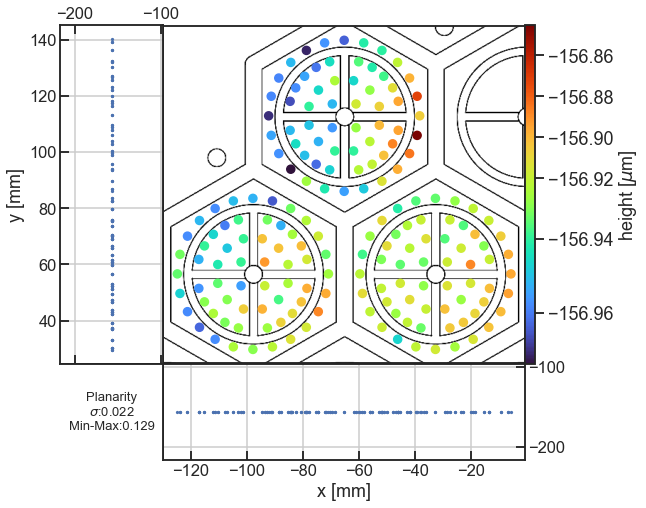

In [ ]:
bf_curing = tdu.add_triplet_color_label(bf_curing_pt)
t_df = bf_curing_pt[bf_curing_pt.trip_color=='blue']
min_, mean_, max_ = tdu.calc_min_mean_max(t_df, mode='z_clean_nan_mean')
tdp.plot_table_hexagon_flatness(t_df, mode='z_clean_nan_mean', cbar_norm = (min_,mean_,max_))

## curing data

In [ ]:
curing_triplets_df = tdu.read_single_measurement(measurement_folder, '20220414_trip_v7_curing.txt')
curing_triplets_df = tdu.df_convert_unix_to_datetime(curing_triplets_df)

In [ ]:
curing_triplets_df.tail()

,run_nr,hex_nr,point,x,y,z,unix_time,datetime
168473,24,11,60,25.65,-120.26,-156.999,1649990010,2022-04-15 04:33:30+02:00
168474,24,11,60,25.83,-120.44,-156.974,1649990010,2022-04-15 04:33:30+02:00
168475,24,11,60,26.08,-120.51,-156.987,1649990010,2022-04-15 04:33:30+02:00
168476,24,11,60,26.33,-120.44,-156.993,1649990010,2022-04-15 04:33:30+02:00
168477,24,11,60,26.51,-120.26,-156.968,1649990011,2022-04-15 04:33:31+02:00


(<Figure size 504x432 with 1 Axes>,
 <AxesSubplot:xlabel='z [µm]', ylabel='Count'>)

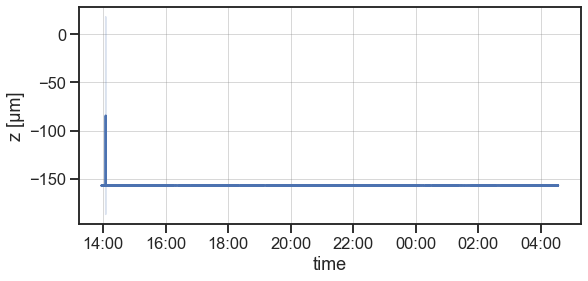

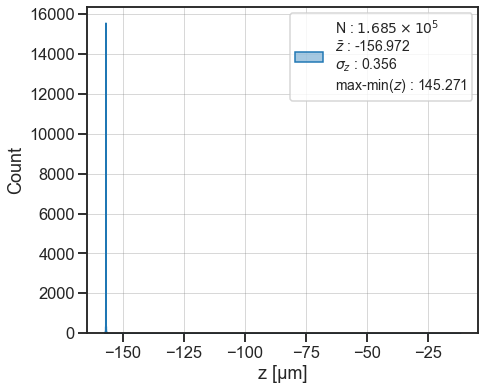

In [ ]:
tdp.plot_data_vs_time(curing_triplets_df)
tdp.ts_hist(curing_triplets_df)

In [ ]:
curing_triplets_df = tdu.remove_outliers(curing_triplets_df, mode='z' ,cut_threshold=0.100)

(<Figure size 504x432 with 1 Axes>,
 <AxesSubplot:xlabel='z [µm]', ylabel='Count'>)

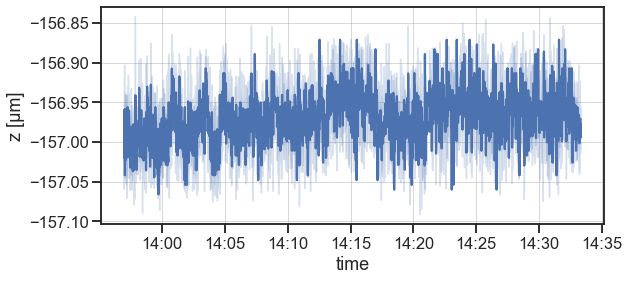

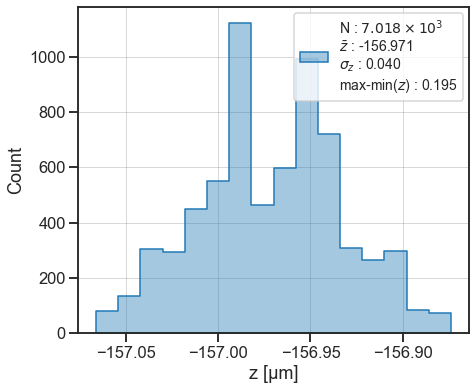

In [ ]:
tdp.plot_data_vs_time(curing_triplets_df.loc[curing_triplets_df.run_nr==1,:], mode='z_clean')
bins = np.arange(curing_triplets_df.z_clean.min(), curing_triplets_df.z_clean.max(), 12e-3)
tdp.ts_hist(curing_triplets_df.loc[curing_triplets_df.run_nr==1,:],mode='z_clean', plot_bins=bins)

c:\Users\Domin\Nextcloud\Master\Disk_Tiling_Measurements\Fwd MADMAX Laser Scanning\tiling_disk_plots.py:159: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


(<Figure size 576x576 with 5 Axes>,
 (<AxesSubplot:>,
  <AxesSubplot:xlabel='x [mm]'>,
  <AxesSubplot:ylabel='y [mm]'>))

posx and posy should be finite values


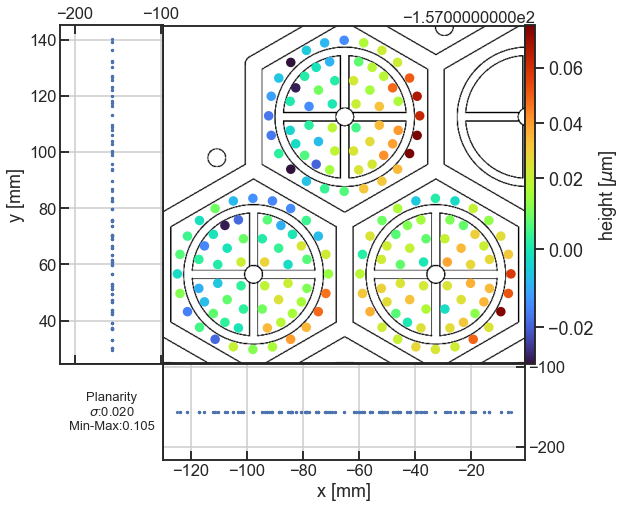

In [ ]:
c_pt = tdu.point_table(curing_triplets_df.loc[curing_triplets_df.run_nr==1,:], z_col='z_clean')
c_pt = tdu.add_triplet_color_label(c_pt)
ct_pt = c_pt[c_pt.trip_color=='blue']
min_, mean_, max_ = tdu.calc_min_mean_max(ct_pt, mode='z_clean_nan_mean')
tdp.plot_table_hexagon_flatness(ct_pt, mode='z_clean_nan_mean', cbar_norm = (min_,mean_,max_))

## split data into runs

In [ ]:
measurements_dict = {}
for run in curing_triplets_df.run_nr.unique(): 
    data = curing_triplets_df.loc[curing_triplets_df.run_nr == run, :]
    # print(data)
    measurements_dict[f'run_nr_{run}'] = data

In [ ]:
measurements_dict_pt = {key: tdu.point_table(data,z_col='z_clean') for key, data in measurements_dict.items()}

In [ ]:
for run_nr, data in measurements_dict_pt.items(): 
    data['run_nr'] = run_nr.split('_')[2]

In [ ]:
measurements_dict_pt = {key: tdu.add_triplet_color_label(data) for key, data in measurements_dict_pt.items()}

In [ ]:
measurements_dict_pt['run_nr_1'].head(5)

,hex_nr,point,unix_time,x,y,z_clean_measurement_error,z_clean_nan_mean,run_nr,trip_color
0,3,1,1.649939e+09,-28.39,-52.27,0.014803,-156.945462,1,yellow
1,3,2,1.649939e+09,-29.27,-43.95,0.015023,-156.950077,1,yellow
2,3,3,1.649939e+09,-23.44,-47.32,0.014105,-156.967385,1,yellow
3,3,4,1.649939e+09,-20.07,-53.15,0.016364,-156.963167,1,yellow
4,3,5,1.649939e+09,-13.31,-51.33,0.016818,-156.957923,1,yellow


In [ ]:
mean_str = 'z_clean_nan_mean'
err_str = 'z_clean_measurement_error'
measurements_dict_pt = {key: tdu.combine_mean_measurements(data,
                                                             bf_curing_pt,
                                                              z_mean_col=mean_str,
                                                              z_err_col=err_str
                                                              ) for key, data in measurements_dict_pt.items()}

In [ ]:
measurements_dict_pt['run_nr_6'].head(3)

,hex_nr,point,unix_time,x,y,z_clean_measurement_error,z_clean_nan_mean,run_nr,trip_color
0,3,1,1.649950e+09,-28.39,-52.27,0.021694,-0.037154,6,yellow
1,3,2,1.649950e+09,-29.27,-43.95,0.020780,-0.070615,6,yellow
2,3,3,1.649950e+09,-23.44,-47.32,0.020538,-0.091538,6,yellow


In [ ]:
for key, data in measurements_dict_pt.items():
    data.rename(columns = {mean_str:'z_mean', err_str:'z_err'}, inplace = True)
    data['z_mean'] = data['z_mean'].apply(lambda z: z*1e3) #* mm -> µm
    data['z_err'] = data['z_err'].apply(lambda z: z*1e3) #* mm -> µm
    data.z_mean = tdu.subtract_mean(data.z_mean)
    measurements_dict_pt[key] = data

c:\Users\Domin\Nextcloud\Master\Disk_Tiling_Measurements\Fwd MADMAX Laser Scanning\tiling_disk_plots.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(ncols=1, nrows=1, figsize=figsize)


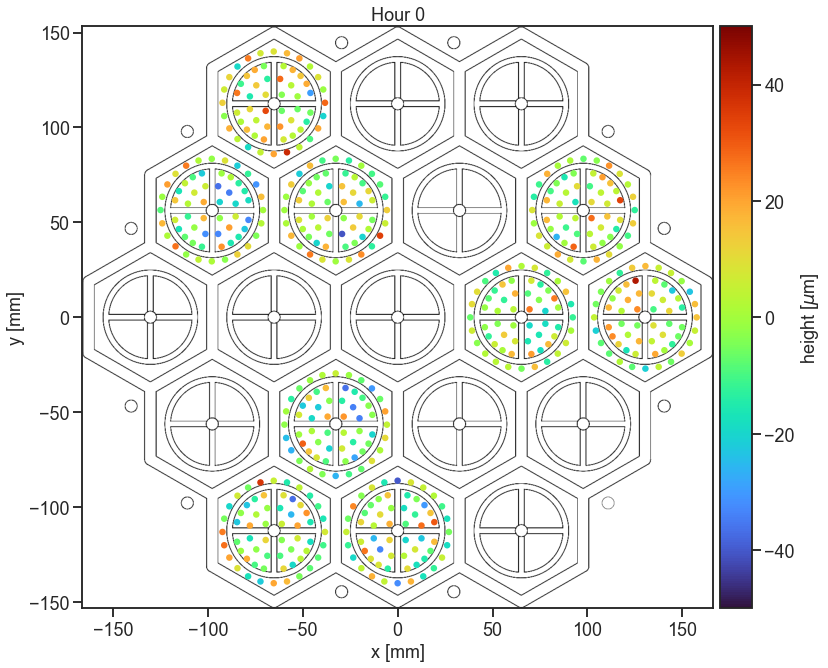

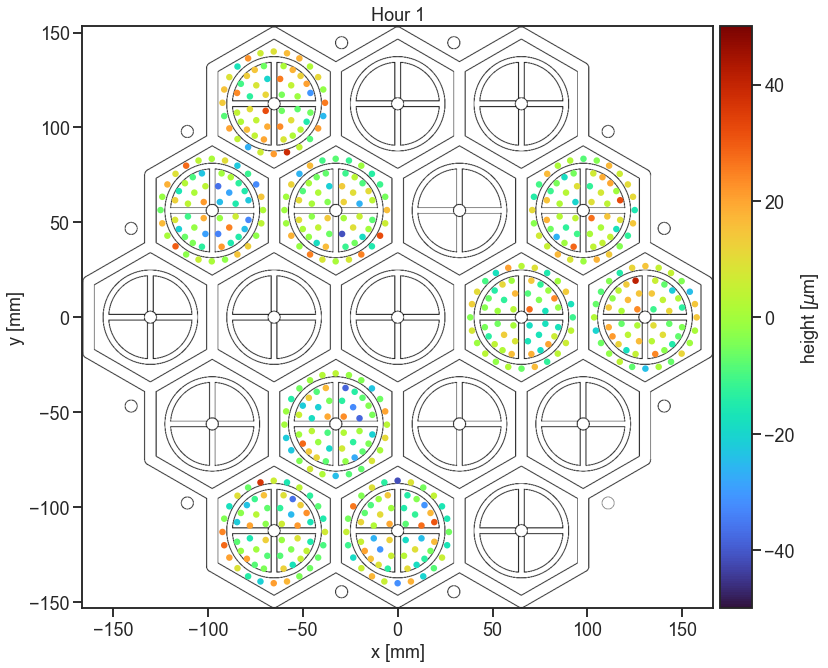

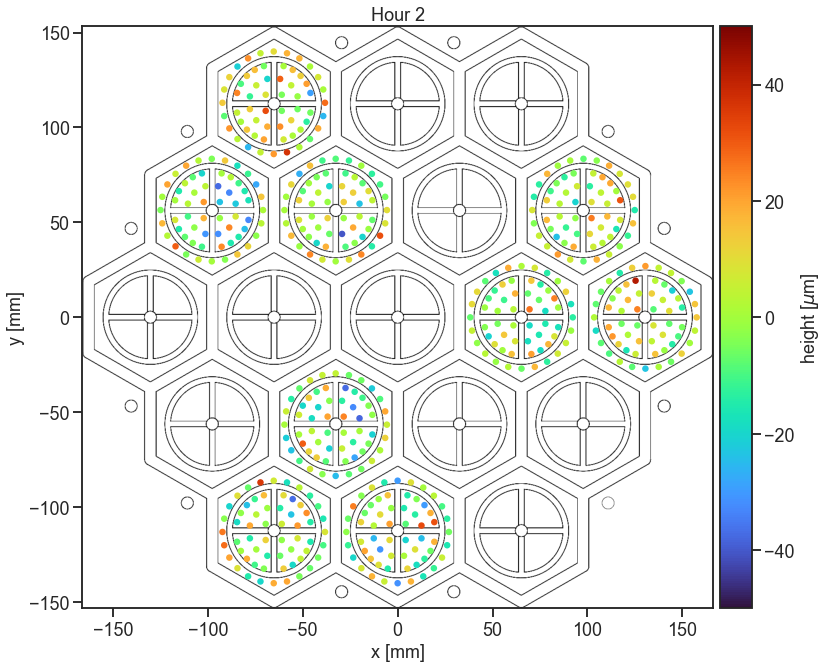

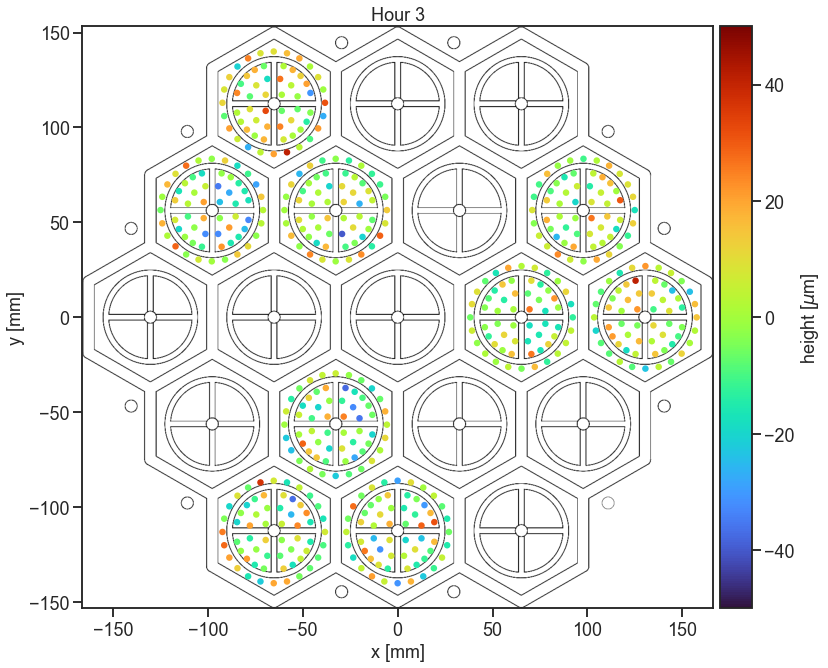

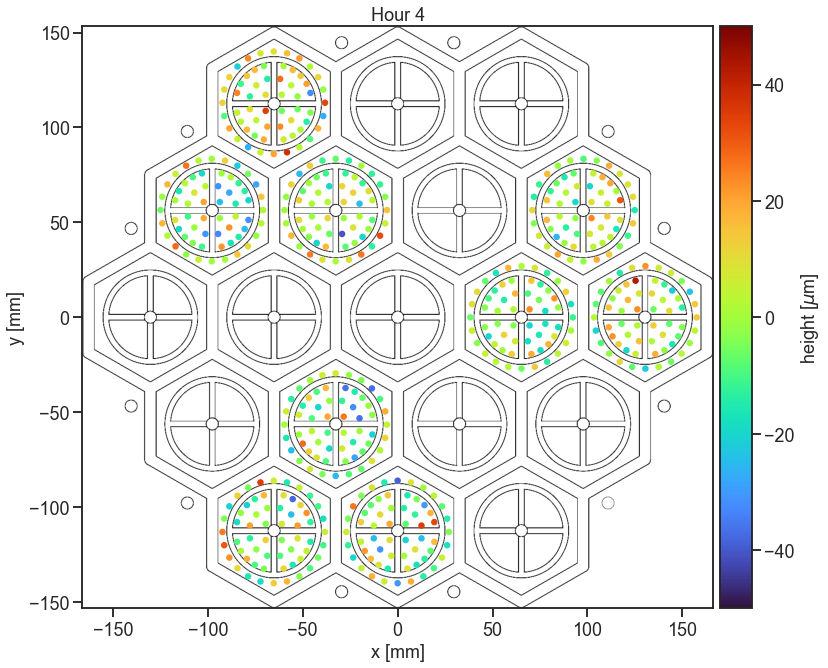

...

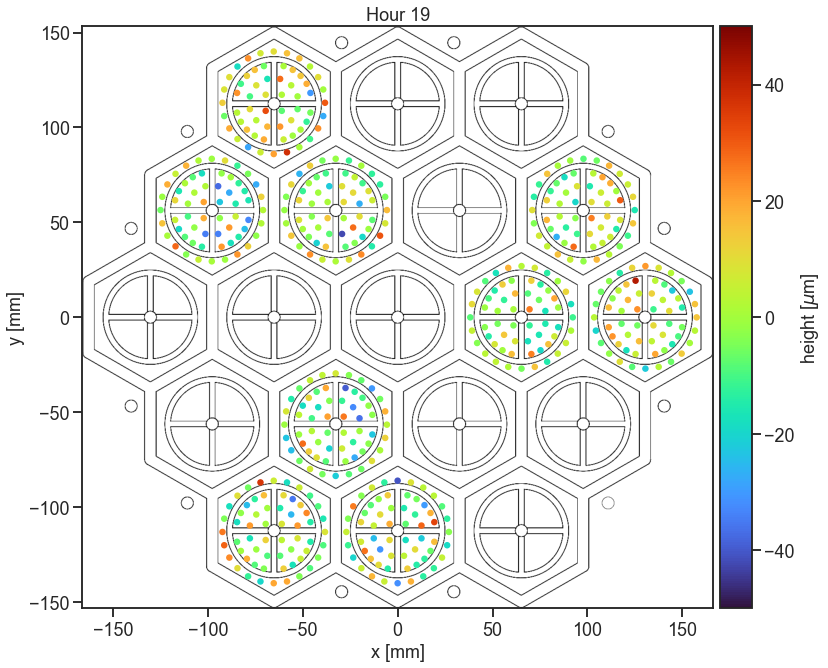

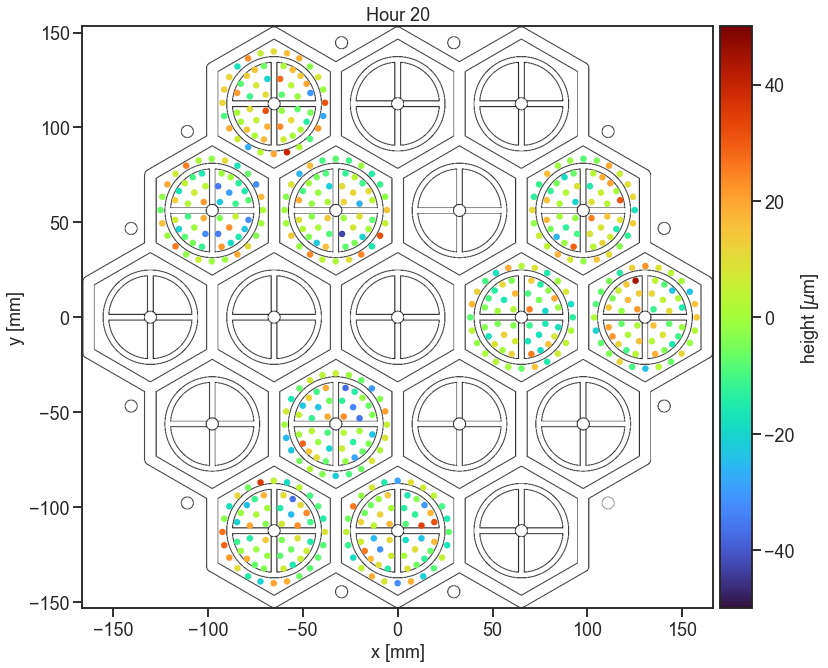

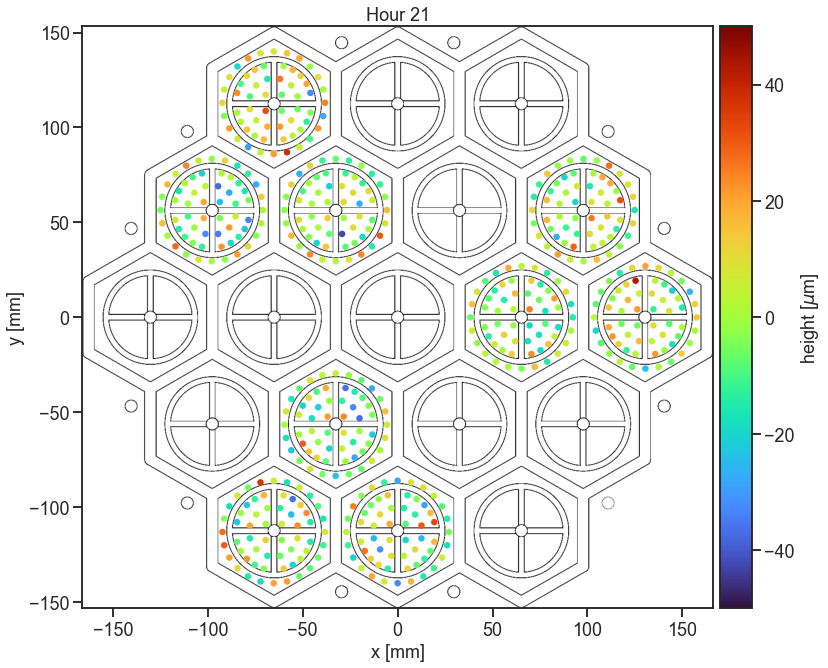

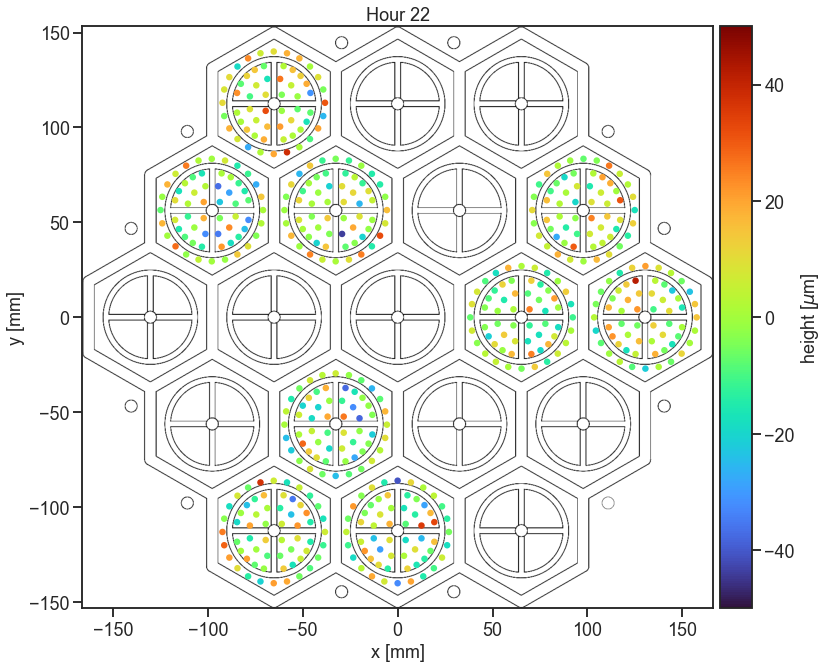

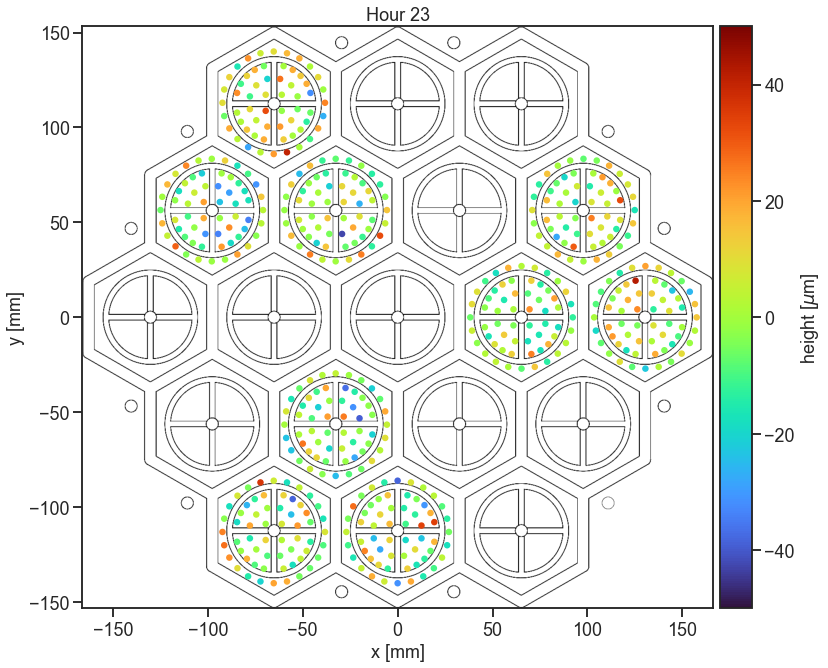

In [ ]:
for key, data in measurements_dict_pt.items(): 
    run_nr = int(key.split('_')[2])
    fig, ax = tdp.full_hexagon_plot(data, mode=('z_mean'), size=5**2, cbar_norm=(-50, 0, 50), cmap='turbo', title=f'Hour {run_nr -1}')

joyplot

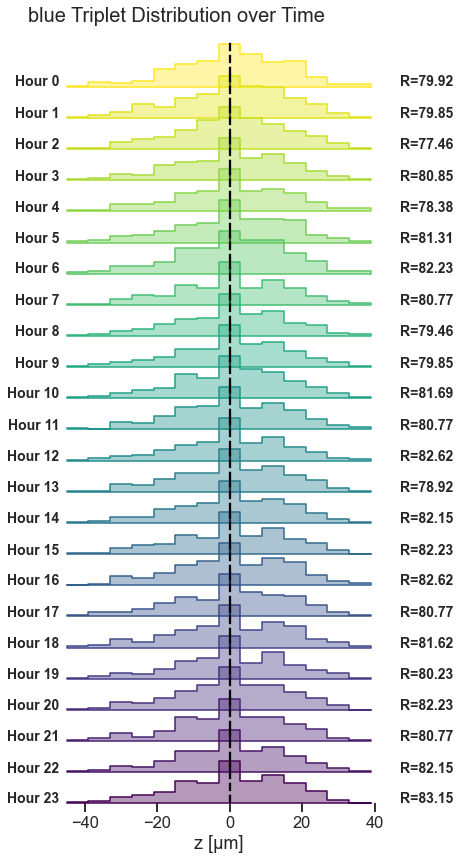

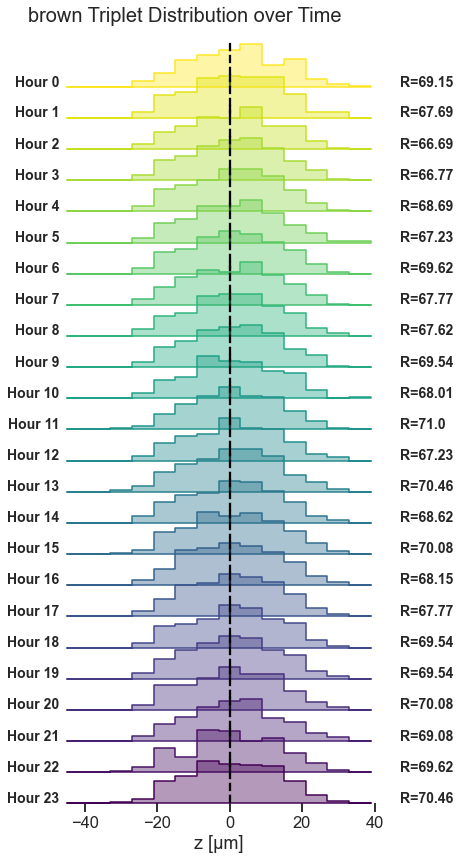

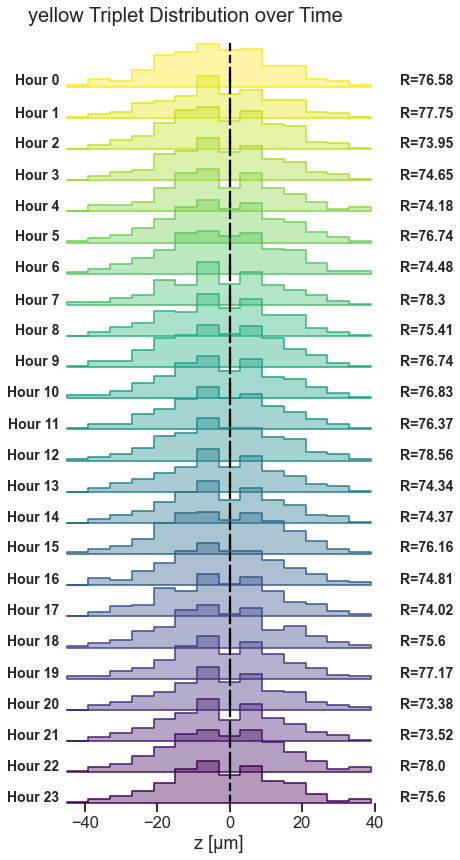

In [ ]:
for col in ['blue', 'brown', 'yellow']:
    tdp.plot_triplet_dist_joyplot(measurements_dict_pt, triplet_color=col)

c:\Users\Domin\Nextcloud\Master\Disk_Tiling_Measurements\Fwd MADMAX Laser Scanning\tiling_disk_plots.py:159: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


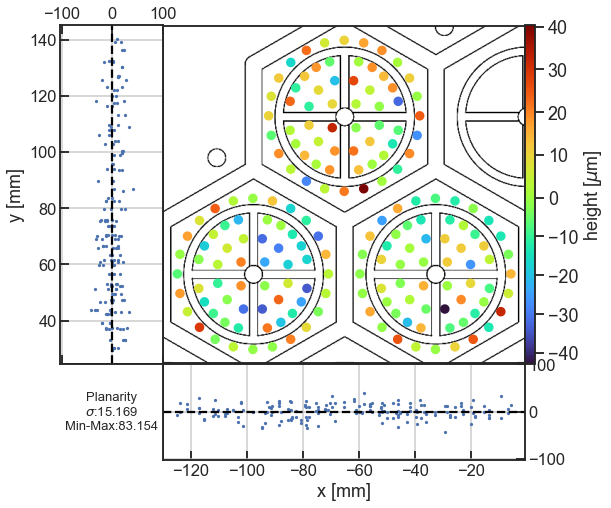

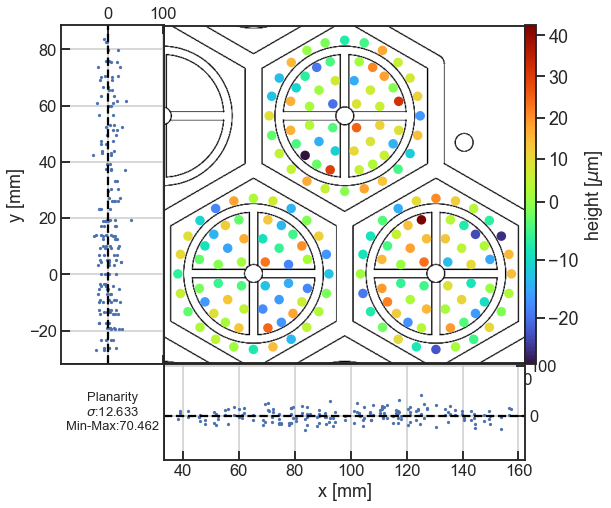

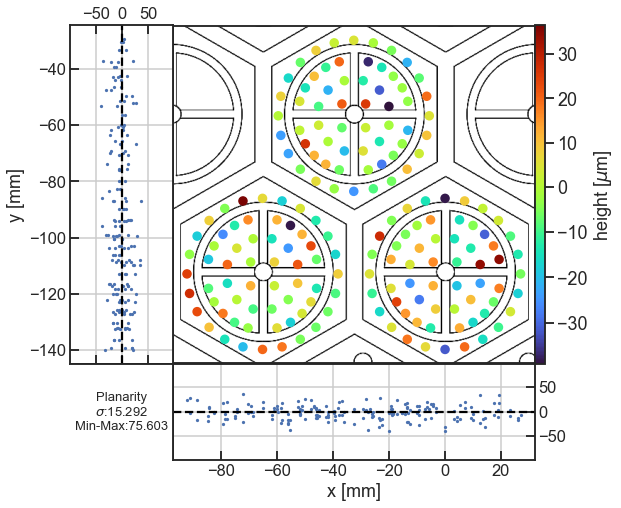

In [ ]:

for col in ['blue', 'brown', 'yellow']:
    plot_df = measurements_dict_pt['run_nr_24']
    plot_df = plot_df[plot_df.trip_color==col]
    min_, mean_, max_ = tdu.calc_min_mean_max(plot_df, mode='z_mean')
    tdp.plot_table_hexagon_flatness(plot_df, mode='z_mean', cbar_norm = (min_,mean_,max_))